In [1]:
import json
from typing import List, Tuple
import contextlib
import io

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.data_utils import CIRRDataset
from src.utils import extract_index_features_clip, device, extract_index_features_with_text_captions_clip
from src.validate_clip import generate_cirr_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
@contextlib.contextmanager
def suppress_output():
    with io.StringIO() as buf, contextlib.redirect_stdout(buf), contextlib.redirect_stderr(buf):
        yield

# Define the decorator to suppress output of the function and any functions it calls
def suppress_function_output(func):
    def wrapper(*args, **kwargs):
        with suppress_output():
            return func(*args, **kwargs)
    return wrapper

In [3]:
def compute_cirr_val_metrics_text_image_modified(
    relative_val_dataset: CIRRDataset,
    clip_text_encoder: torch.nn.Module,
    clip_tokenizer: callable,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on CIRR dataset combining text and image distances.

    :param relative_val_dataset: CIRR validation dataset in relative mode
    :param clip_text_encoder: CLIP text encoder
    :param clip_tokenizer: CLIP tokenizer
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function, 
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        # Sort the results
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(
            image_index_names if image_index_names else multiple_text_index_names[0]
        )[sorted_indices]
    
        # Delete the reference image from the results
        reference_mask = torch.tensor(
            sorted_index_names != np.repeat(
                np.array(reference_names),
                len(image_index_names)
            ).reshape(len(target_names), -1)
        )
    
        sorted_index_names = sorted_index_names[reference_mask].reshape(
            sorted_index_names.shape[0],
            sorted_index_names.shape[1] - 1
        )
    
        # Compute the ground-truth labels with respect to the predictions
        labels = torch.tensor(
            sorted_index_names == np.repeat(
                np.array(target_names),
                len(sorted_index_names[0])
            ).reshape(len(target_names), -1)
        )
        
        # Compute the subset predictions and ground-truth labels
        group_members = np.array(group_members)
        group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
        group_labels = labels[group_mask].reshape(labels.shape[0], -1)

        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())
    
        # Compute the metrics
        recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
        recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
        group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
        group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
        
        results.append({
            "alpha": alpha,
            "recall_at1": recall_at1,
            "recall_at5": recall_at5,
            "recall_at10": recall_at10,
            "recall_at50": recall_at50,
            "group_recall_at1": group_recall_at1,
            "group_recall_at2": group_recall_at2,
            "group_recall_at3": group_recall_at3,
        })

    return pd.DataFrame(results)

In [4]:
cache = {}

@suppress_function_output
def cirr_val_retrieval_text_image_modified(
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer: callable,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on CIRR validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param clip_text_encoder: CLIP text model
    :param clip_img_encoder: CLIP image model
    :param clip_tokenizer: CLIP tokenizer
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    """
    global cache
    
    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions_clip(
                classic_val_dataset,
                clip_text_encoder,
                clip_tokenizer,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features_clip(
            classic_val_dataset, clip_img_encoder
        )
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names
        }
    else:
        multiple_index_features = cache['index_cache']["multiple_index_features"]
        multiple_index_names = cache['index_cache']["multiple_index_names"]
        image_index_features = cache['index_cache']["image_index_features"]
        image_index_names = cache['index_cache']["image_index_names"]

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    return compute_cirr_val_metrics_text_image_modified(
        relative_val_dataset,
        clip_text_encoder,
        clip_tokenizer,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the CLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [5]:
CLIP_NAME = 'laion/CLIP-ViT-L-14-laion2B-s32B-b82K'

In [6]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32, projection_dim=768)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,

In [7]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME,torch_dtype=torch.float32, projection_dim=768)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder.eval()

clip img encoder loaded.

CLIPVisionModelWithProjection(
  (vision_model): CLIPVisionTransformer(
    (embeddings): CLIPVisionEmbeddings(
      (patch_embedding): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
      (position_embedding): Embedding(257, 1024)
    )
    (pre_layrnorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-23): 24 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (out_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (layer_norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1024, out_features=40

In [8]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [9]:
clip_tokenizer = tokenize

In [10]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [11]:
combining_function_original = element_wise_sum_original

In [12]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [13]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [14]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the CIRR dataset</div>

In [15]:
with open('../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [29]:
def convert_to_pivot(
    data: List[pd.DataFrame]
) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)

    # Create pivot tables for 
    recall_at1 = category_df.pivot(index='alpha', columns='beta', values='recall_at1')
    recall_at5 = category_df.pivot(index='alpha', columns='beta', values='recall_at5')
    recall_at10 = category_df.pivot(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot(index='alpha', columns='beta', values='recall_at50')
    group_recall_at1 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at1')
    group_recall_at2 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at2')
    group_recall_at3 = category_df.pivot(index='alpha', columns='beta', values='group_recall_at3')

    return recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [32]:
grid_search_betas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for beta in tqdm(grid_search_betas, desc="Grid Search Betas"):
    result = cirr_val_retrieval_text_image_modified(
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot(total_result)

Grid Search Betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [33]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,8.012437,8.132026,8.275532,8.514710,9.016982,9.567089,10.045443,10.762975,11.360919,12.485051,...,15.020330,17.029420,19.684286,23.463286,27.194452,29.514471,30.806026,29.897153,27.601051,24.874432
0.05,8.036355,8.275532,8.490792,8.873475,9.256159,9.662760,10.165032,11.002152,11.743602,12.556805,...,15.450849,17.603444,20.497489,24.635255,27.577135,30.088496,31.356135,30.399427,27.888066,25.304952
0.10,7.892849,8.203779,8.658215,8.945228,9.256159,9.878019,10.452045,11.241329,11.671849,12.676392,...,15.809615,17.723033,20.617077,24.707007,28.318584,30.638602,31.308299,30.447263,28.270748,25.711551
0.15,7.701506,8.108108,8.466874,8.777805,9.303994,9.878019,10.499880,11.049988,11.934943,12.963405,...,15.953121,18.153551,21.023679,24.707007,28.222913,30.327672,30.734274,30.088496,28.031573,26.189905
0.20,7.821096,8.179861,8.371203,8.969146,9.184406,9.567089,10.380292,10.978235,12.030615,13.035159,...,16.144463,17.914374,21.238938,24.754843,27.672806,29.370964,29.705811,29.179621,27.720642,25.878978
0.25,7.701506,7.940684,8.251614,8.634298,8.921311,9.447501,10.093279,10.954317,11.958861,12.819900,...,16.120546,18.512318,21.502033,24.874432,27.505383,28.677350,28.796938,28.151160,27.003109,25.185362
0.30,7.773260,8.155943,8.347286,8.729969,9.088735,9.351829,9.949773,10.858646,11.647931,12.772064,...,16.264051,18.871084,21.741210,24.754843,27.170533,28.031573,28.414255,27.290121,26.094237,24.180818
0.35,7.749342,7.916766,8.203779,8.514710,8.706051,9.160488,9.734514,10.715140,11.480507,12.437216,...,16.455394,19.014589,21.382445,24.132982,26.644343,27.457547,27.337956,26.070318,25.089690,23.511122
0.40,7.486247,7.749342,7.964602,8.299450,8.562545,8.897393,9.567089,10.452045,11.145659,12.317628,...,16.574982,18.966754,21.406361,23.654628,25.687635,26.692179,26.213825,25.161445,23.845969,22.195648


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,27.457547,27.935901,28.868693,29.610142,30.255920,31.284383,32.336763,33.413059,35.589573,37.790003,...,42.645299,46.280795,50.585985,54.436737,58.407080,60.822767,60.368335,58.478832,54.939008,50.155467
0.05,27.648887,28.462091,28.988281,29.681894,30.590767,31.380051,32.504186,34.058839,35.876584,38.364029,...,43.817270,47.572351,51.686198,55.560869,59.339869,61.396796,60.894525,58.957189,55.584788,50.992584
0.10,27.911982,28.677350,29.394883,30.184168,31.021288,31.977996,33.197799,34.991628,36.665869,38.985887,...,44.271705,48.146376,52.547240,56.876343,60.176992,62.090409,61.038029,59.100693,55.800050,51.470941
0.15,28.151160,28.844774,29.657978,30.375507,31.332219,32.456350,33.843577,35.254723,37.072471,39.009807,...,45.108825,48.792154,53.264767,57.378620,60.057402,61.994737,61.014110,58.885431,55.536956,51.614445
0.20,27.792394,28.342500,29.275292,30.447263,31.475723,32.815117,33.987084,35.350394,37.311649,39.320737,...,45.587179,49.079168,53.264767,57.378620,59.674716,60.942358,60.176992,57.737386,54.556328,51.088256
0.25,27.577135,28.079405,28.988281,29.968908,31.021288,32.288927,34.011003,35.493901,37.024635,39.679503,...,45.587179,49.318346,53.193015,56.732839,58.957189,59.937817,58.550584,56.374073,53.336525,50.322890
0.30,27.074862,27.911982,28.653431,29.418799,30.829945,32.001913,33.939248,35.350394,37.120306,39.655584,...,45.587179,49.270511,52.762496,56.182730,58.120066,58.431000,57.235110,55.273861,52.140635,49.414015
0.35,26.453000,27.218369,28.222913,29.083952,30.375507,31.786653,33.293471,34.943792,36.594117,39.488161,...,45.395839,49.222675,52.427649,55.202103,56.948102,56.852430,55.823964,53.671372,51.279598,48.265964
0.40,26.046401,26.596507,27.601051,28.533843,29.634058,30.853862,32.719445,34.561110,36.498445,38.890219,...,44.965318,48.911744,52.092803,54.293233,55.752212,55.536956,53.862715,51.662284,49.724945,46.950489


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,38.459697,39.440325,40.397033,41.569003,42.621383,43.817270,45.228416,47.237504,49.366179,51.734036,...,57.761300,61.588138,65.582395,69.265723,71.944511,73.164314,72.518533,70.246351,66.347766,61.588138
0.05,39.153314,39.870843,40.875387,42.023438,43.099737,44.343460,45.898110,47.811529,50.035876,52.571154,...,59.052861,62.688351,66.706532,70.342022,72.877300,74.168861,73.427409,70.916051,67.041379,62.712270
0.10,39.535996,40.157858,41.114566,41.927770,43.027985,44.773978,46.400383,48.289883,50.562066,53.336525,...,59.889978,63.358051,67.471898,70.868212,73.092562,74.144942,73.451328,71.059555,67.352307,62.951446
0.15,39.512077,40.277445,40.899307,41.832098,43.195409,44.989237,46.615642,48.552978,51.088256,53.862715,...,60.200912,63.884240,67.950249,70.868212,73.020810,73.857927,73.283905,70.413774,66.850036,62.975365
0.20,39.416409,40.014350,40.923223,42.358288,43.697679,45.204496,46.615642,48.959580,51.686198,54.269314,...,60.464007,64.338672,67.830664,70.916051,72.638124,73.188233,72.303277,69.815832,66.299927,62.497008
0.25,39.296818,40.062186,41.042814,42.190865,43.745515,45.084909,46.830902,49.174839,51.710117,54.197562,...,60.798854,64.362592,67.519730,70.557284,72.398949,72.111934,71.298730,68.691701,65.175796,61.588138
0.30,38.651040,39.727339,40.803635,41.879934,43.482420,45.252332,46.950489,49.246591,51.734036,54.341066,...,60.822767,64.625686,67.471898,70.150679,71.250898,70.916051,70.007175,67.065293,63.645059,60.416168
0.35,38.411865,39.248982,40.205693,41.377661,43.171489,44.989237,46.926573,48.935661,51.590526,54.580241,...,60.798854,63.908154,66.921788,69.193971,69.935423,69.791913,68.045920,65.486723,62.257832,59.196365
0.40,37.622577,38.698876,39.727339,40.899307,42.693135,44.582635,46.567807,49.270511,51.757956,54.508489,...,60.798854,63.764650,66.156423,67.734993,68.859124,68.093759,66.443437,64.123416,60.966277,57.928723


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,66.658694,67.687154,68.835205,70.198518,71.872759,73.594832,75.340825,77.230328,79.239416,81.583351,...,85.553694,87.419277,89.213109,90.313321,91.365701,91.796219,91.533124,90.026307,86.414731,82.109541
0.05,67.041379,68.117678,69.552737,70.844299,72.494620,74.288446,76.225781,77.947861,80.124372,82.133460,...,86.223394,88.065058,89.715379,90.791678,91.939729,92.250657,91.915810,90.432912,86.988759,82.659650
0.10,67.567569,68.596029,69.696248,71.131307,73.020810,75.197321,76.823729,78.665394,80.722314,82.827073,...,87.060511,88.399905,90.145898,91.102606,92.298496,92.418081,91.963643,90.456831,87.084430,82.874912
0.15,67.926335,68.954796,70.078927,71.753168,73.762256,75.508249,77.254248,79.071993,81.200671,83.401102,...,87.275773,89.045686,90.456831,91.317868,92.154986,92.322409,91.915810,90.145898,86.893088,82.707489
0.20,67.830664,69.098300,70.413774,72.590292,74.360204,75.843102,77.708679,79.646015,81.846446,83.688110,...,87.610620,89.189190,90.432912,91.246116,91.820139,92.035401,91.604877,89.739299,86.510402,82.157379
0.25,67.758912,69.217891,70.963883,72.662044,74.408036,75.938773,77.900022,80.100453,82.229131,83.999044,...,87.730211,89.284861,90.361160,91.054773,91.365701,91.580963,90.791678,89.189190,85.625446,81.415927
0.30,67.447978,69.385314,71.131307,72.709876,74.312365,76.154029,78.043532,80.124372,82.396555,84.022963,...,87.706292,89.165270,90.050226,90.600336,91.078687,90.911263,89.930636,88.184643,84.573066,80.722314
0.35,67.304474,69.361395,71.107394,72.805548,74.192774,76.201868,78.163117,79.909110,82.276970,84.262139,...,87.610620,88.926095,89.524037,90.193731,90.456831,89.667541,88.806504,86.893088,83.472854,79.861277
0.40,66.993541,68.691701,70.796460,72.542453,74.073189,75.986606,77.971774,79.669935,82.061708,83.903372,...,87.419277,88.543409,89.404446,89.667541,89.524037,88.830423,87.467110,85.410190,81.918204,78.904569


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,21.071514,21.502033,22.052141,23.176274,24.085148,25.065774,26.309496,27.840230,29.753646,31.858408,...,36.450610,39.918679,44.439128,48.792154,53.312606,57.402533,61.731642,64.697438,66.610861,66.491270
0.05,21.023679,21.478115,22.219564,22.937097,24.061230,24.970102,26.381248,27.864146,29.992825,32.312843,...,37.407318,41.018894,45.300168,50.059795,54.197562,58.311409,62.592679,65.654153,66.945708,66.993541
0.10,21.143267,21.956469,22.434825,23.224109,24.372160,25.304952,26.835686,28.677350,30.232003,32.288927,...,38.340110,41.664675,45.730686,50.514233,55.536956,59.435540,62.664437,65.773737,67.280555,67.376226
0.15,21.286774,22.243482,22.697920,23.558958,24.396077,25.591964,27.385792,29.179621,30.758193,33.102128,...,39.105478,42.406124,46.376464,50.968665,56.015307,59.794307,62.975365,65.773737,67.113131,67.639321
0.20,21.095432,22.099976,23.032767,23.965558,24.683090,25.998566,27.648887,29.705811,31.595314,33.819661,...,39.703420,43.027985,47.117916,51.423103,56.063145,60.009569,63.118869,65.630233,66.897869,67.304474
0.25,21.454197,22.147812,23.008850,23.893805,25.185362,26.453000,28.055489,30.040661,31.977996,34.178427,...,40.564460,43.936858,47.811529,51.901460,55.943555,59.626883,62.353504,64.649606,66.395599,66.682613
0.30,21.430279,22.530495,23.271945,24.180818,25.544128,26.787850,28.557763,30.423343,32.528102,34.704617,...,40.923223,44.415212,47.978953,52.068883,55.776131,59.292036,62.162161,64.171249,65.295386,65.678066
0.35,21.334609,22.171730,23.343697,24.563502,25.544128,27.003109,28.701267,30.758193,32.910788,35.135135,...,41.162401,44.534799,48.170295,52.331978,55.847883,59.076774,61.803395,63.262379,64.243007,64.912701
0.40,21.238938,22.171730,23.200192,24.348243,25.496292,26.787850,28.462091,30.614686,32.839033,35.302559,...,41.305909,44.845730,48.529059,52.068883,55.871803,58.909351,60.990196,62.784022,63.525474,64.195168


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,41.545084,42.501795,43.793350,45.037073,46.185124,47.907200,49.701029,51.399189,53.288686,55.967474,...,61.779481,65.438890,69.074386,72.375029,75.819182,78.832817,80.961490,82.468307,83.735949,83.831620
0.05,41.473332,42.501795,43.673763,45.228416,46.663478,48.265964,50.227219,51.805788,54.077971,56.900263,...,62.975365,65.845490,69.648409,73.236066,76.632386,79.406840,81.607270,82.659650,84.022963,84.286058
0.10,41.784263,42.860559,44.080365,45.300168,46.759149,48.696485,50.490314,52.403730,54.436737,57.498205,...,63.573307,66.610861,70.198518,73.905766,77.038985,80.100453,81.918204,82.683569,84.405643,84.477395
0.15,41.760343,42.860559,44.176033,45.252332,47.093996,48.935661,51.016504,53.001672,54.771584,57.713467,...,64.290839,67.041379,70.676869,74.049270,77.708679,79.717773,81.368095,82.803160,84.118634,84.022963
0.20,41.879934,43.123654,44.295624,45.850274,47.644106,49.533606,51.494861,53.288686,55.560869,58.120066,...,64.649606,67.567569,70.892131,74.479789,77.684766,79.382920,81.320256,82.611817,83.759868,83.831620
0.25,42.119110,43.171489,44.486964,46.113369,47.955036,49.629274,51.997131,53.647453,56.326240,59.052861,...,65.821576,68.428606,71.322650,74.790722,77.349919,79.119825,81.033248,82.587898,83.329350,83.472854
0.30,42.023438,43.123654,44.726142,46.232960,47.835445,49.557522,52.044964,54.364985,57.091606,59.961730,...,66.084671,69.050467,71.585745,75.029898,77.062905,79.048073,80.985409,82.061708,82.994497,83.353263
0.35,41.975603,43.338913,44.797894,46.209040,47.859365,49.916288,52.140635,54.628080,57.354701,60.464007,...,66.156423,69.074386,72.040182,74.790722,76.775891,78.354460,80.435300,81.918204,82.659650,82.779241
0.40,41.999522,43.219325,44.750059,46.280795,48.218131,50.227219,52.714664,54.891175,57.569957,60.129154,...,66.467351,69.217891,72.016263,74.312365,76.488876,78.450131,79.909110,81.176752,81.989956,82.181299


beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,61.970818,63.118869,64.195168,65.175796,66.228175,67.328387,68.572110,70.413774,72.757715,74.718964,...,79.382920,81.344175,83.664197,85.864627,87.443197,89.213109,90.074146,91.054773,91.652715,91.963643
0.05,62.138242,63.142788,64.027745,65.414971,66.610861,67.806745,69.098300,70.916051,73.307818,75.532168,...,80.148292,82.157379,84.142548,86.223394,88.065058,89.284861,90.313321,91.317868,91.963643,92.370248
0.10,62.018657,63.358051,64.338672,65.534562,66.850036,68.404686,70.031095,71.633583,73.475248,75.962687,...,80.650562,82.803160,84.764409,86.582160,88.112891,89.428365,90.337241,91.580963,92.178905,92.250657
0.15,62.281752,63.381964,64.386511,65.725905,67.184883,68.404686,70.174599,71.896678,74.049270,76.488876,...,80.961490,83.090168,84.884000,87.060511,88.208562,89.332694,90.839511,91.772306,92.178905,92.561591
0.20,62.066489,63.334131,64.697438,65.606314,67.065293,68.930876,70.676869,72.470701,74.455869,76.704139,...,81.224585,83.472854,85.123175,87.084430,88.423824,89.476204,90.935183,91.580963,92.178905,92.513752
0.25,62.090409,63.334131,64.434344,65.941161,67.567569,69.457066,71.226978,73.164314,74.982059,77.182490,...,81.631190,83.425015,85.147095,86.940920,88.184643,89.595789,90.791678,91.724467,91.915810,92.226738
0.30,62.162161,63.358051,64.697438,66.156423,67.854577,70.055008,71.609664,73.881847,75.340825,77.565175,...,81.798613,83.616358,85.266685,86.940920,88.208562,89.715379,90.408993,90.959102,91.533124,92.011482
0.35,62.257832,63.549387,64.984453,66.395599,68.141592,70.318103,72.016263,74.025351,75.747430,77.876109,...,81.918204,83.664197,85.481942,86.893088,88.184643,89.524037,90.121979,91.006935,91.413540,91.820139
0.40,62.281752,63.621145,65.080124,66.754365,68.667781,70.581198,72.422868,74.288446,76.058358,78.187037,...,82.157379,83.879453,85.529780,86.821336,88.256401,89.332694,89.811051,90.552497,90.935183,91.437453


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [34]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_574/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [35]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

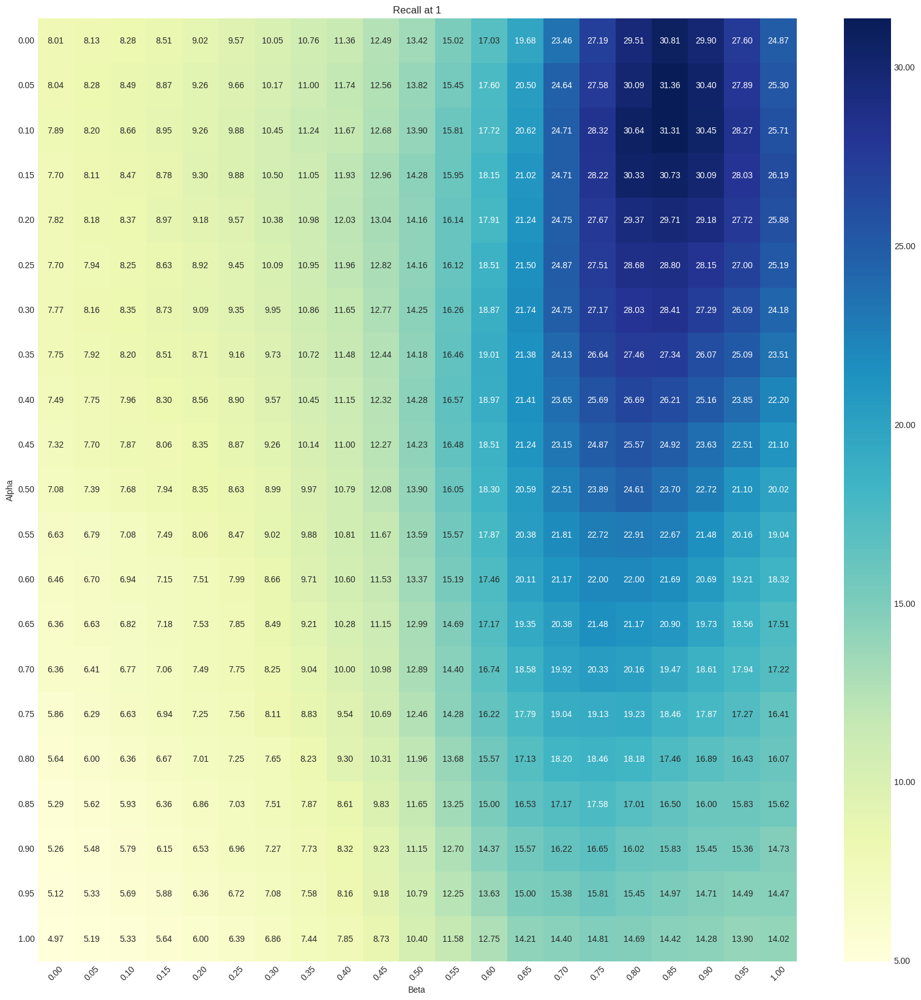

In [36]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

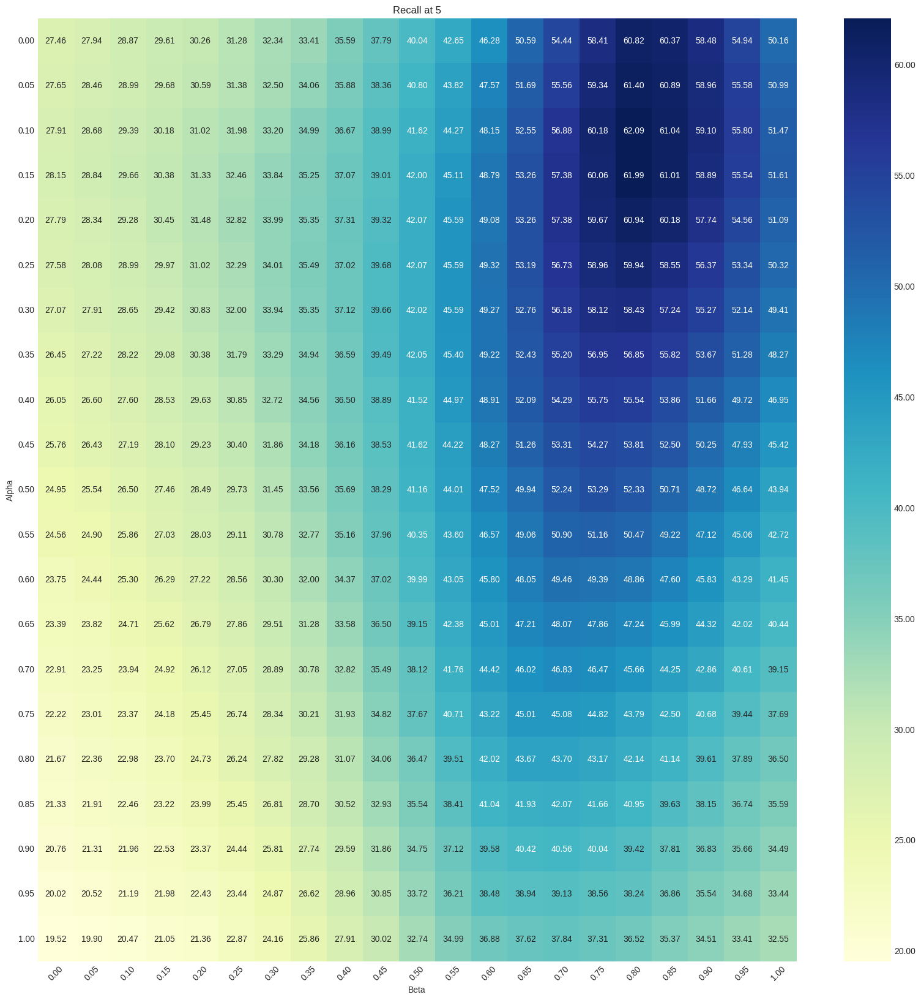

In [37]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

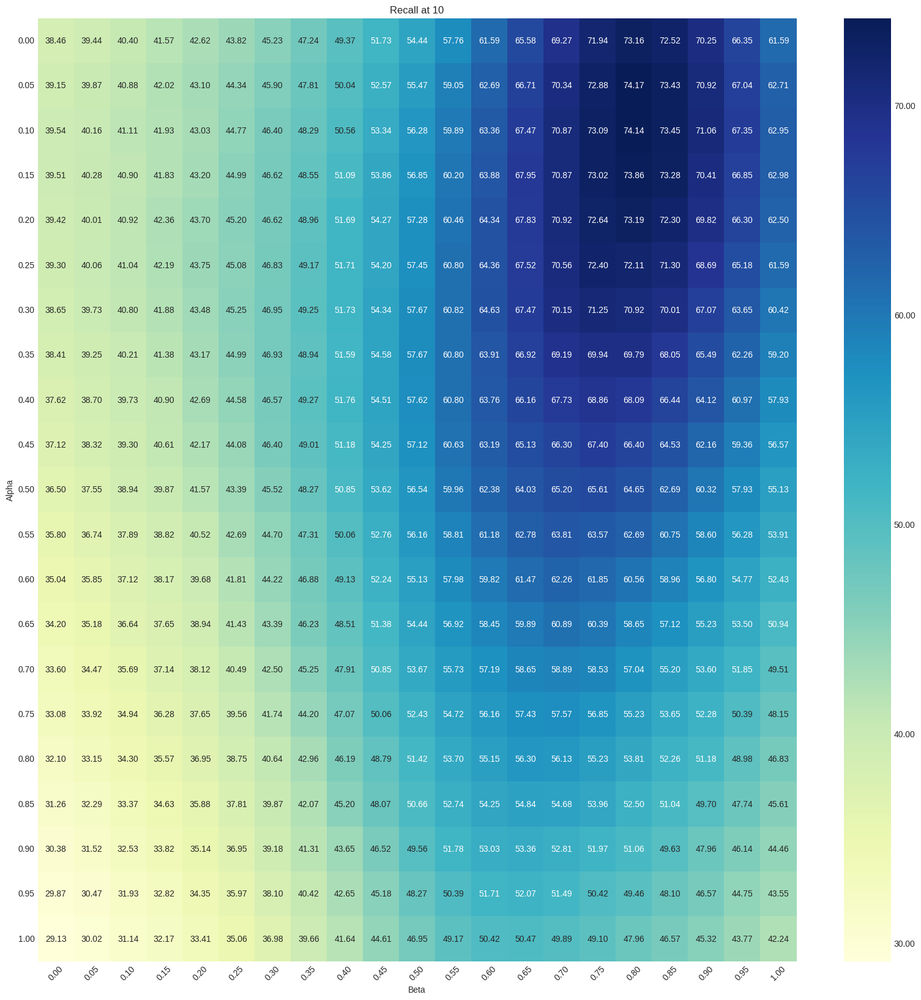

In [38]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

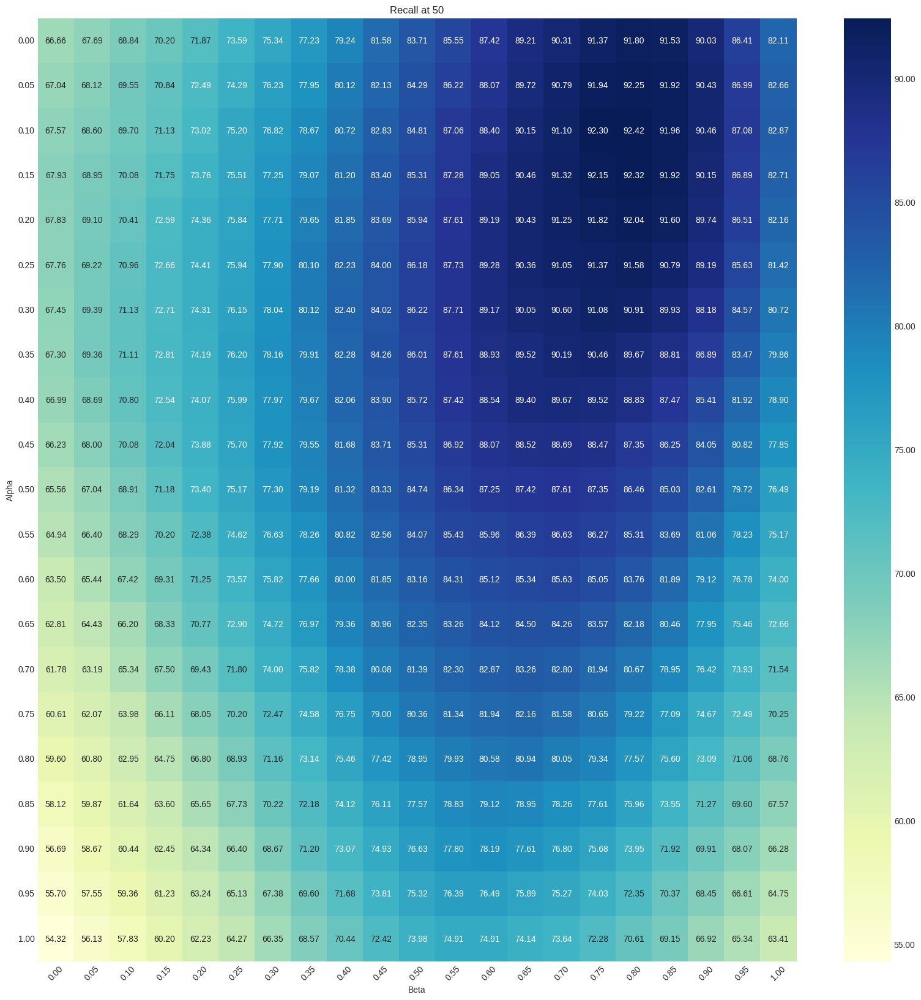

In [39]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

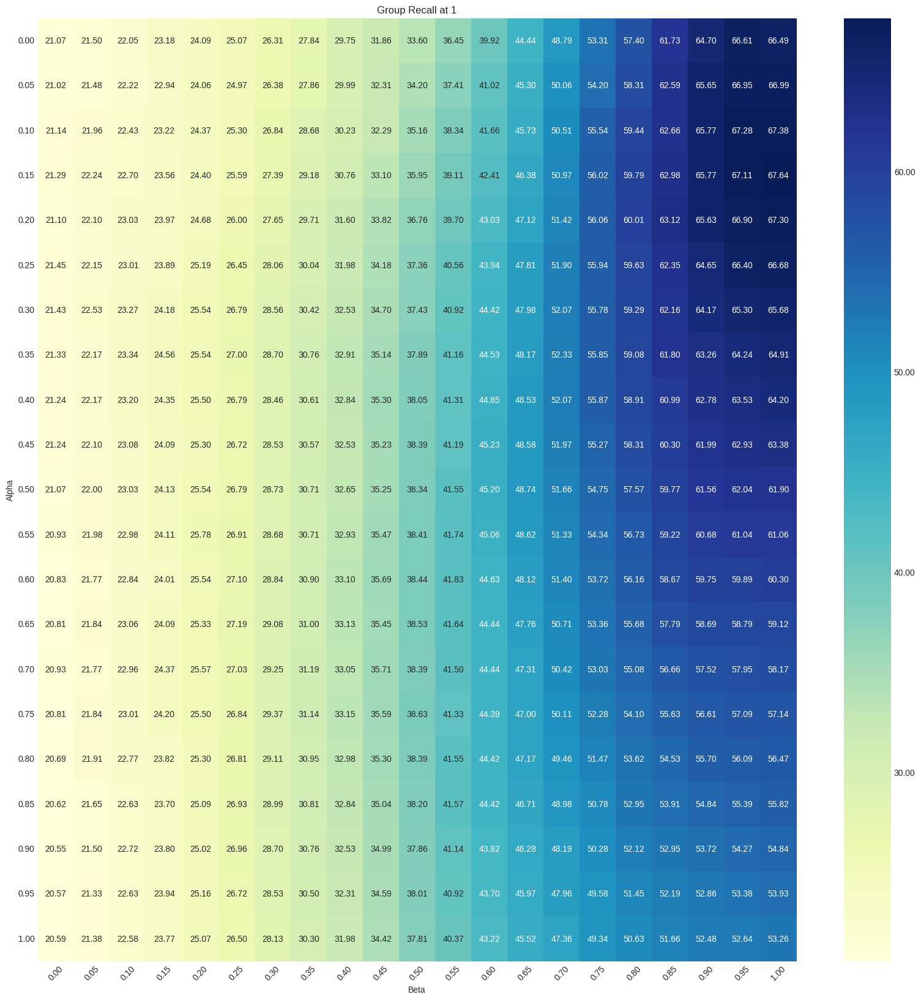

In [40]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

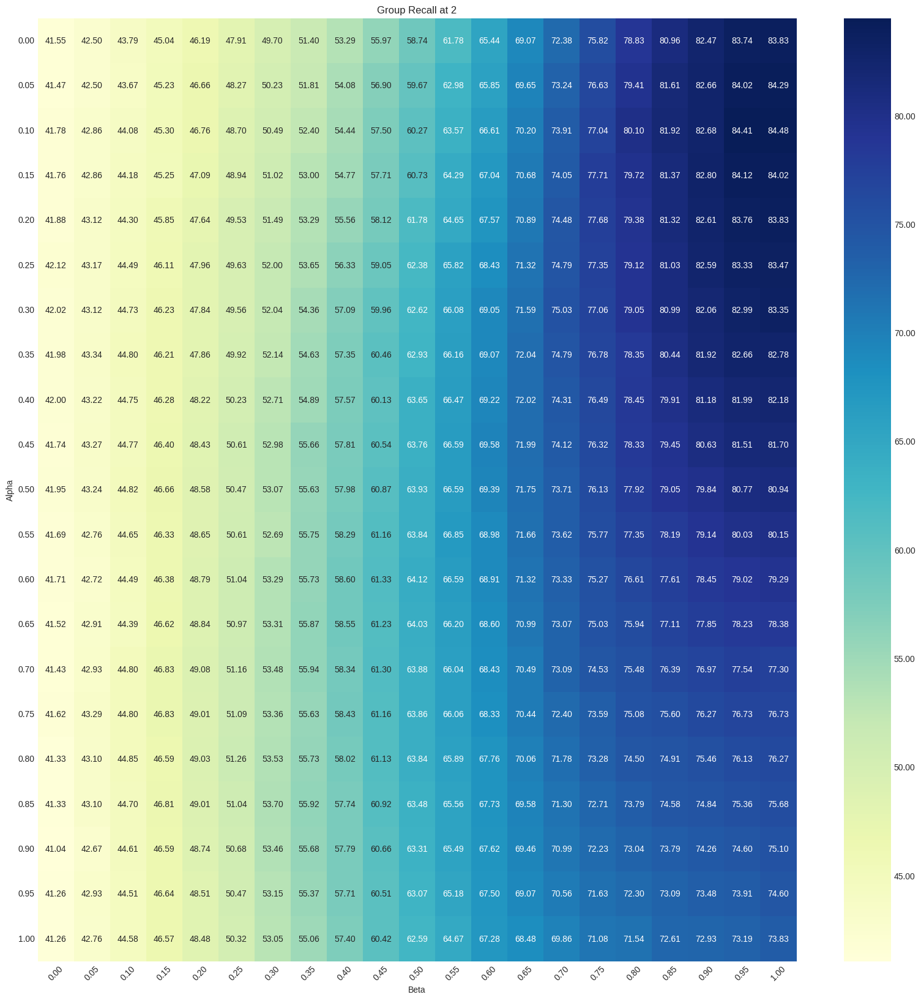

In [41]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

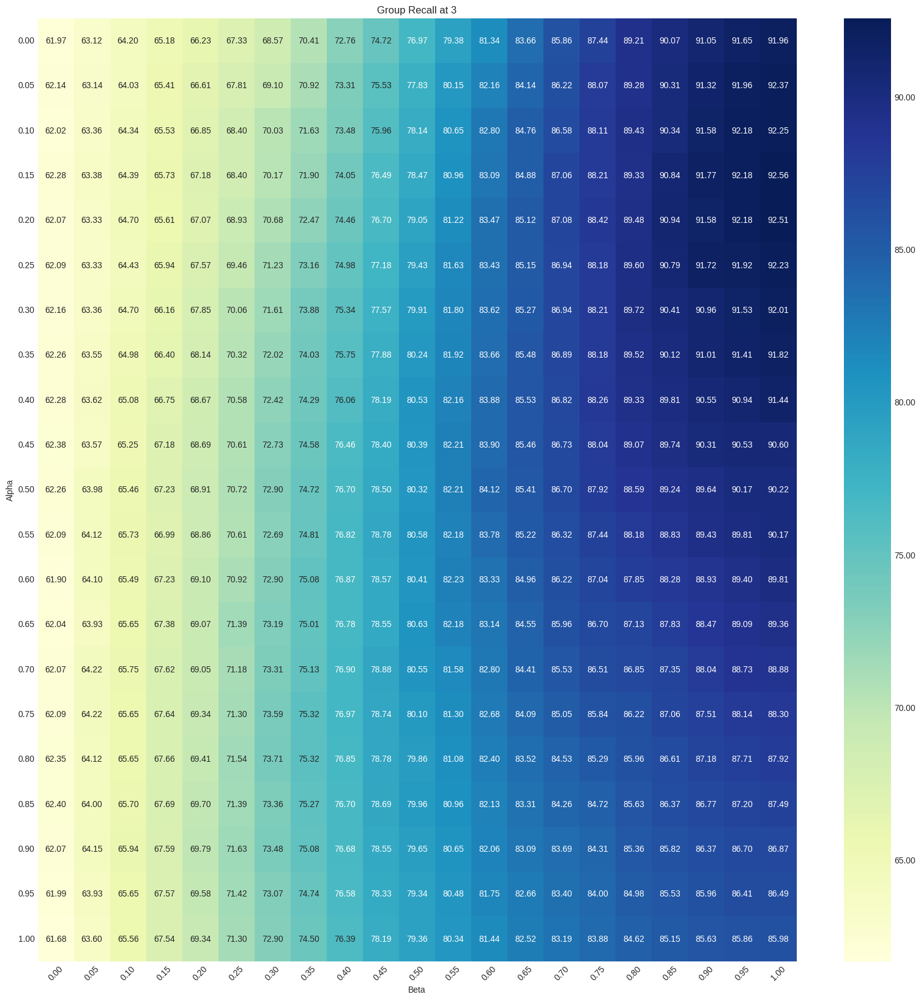

In [42]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [16]:
def compute_results(
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer: callable,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on CIRR dataset combining text and image distances.
    
    :param dress_type: CIRR category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param clip_text_encoder: CLIP text model
    :param clip_img_encoder: CLIP image model
    :param clip_tokenizer: CLIP tokenizer
    :param text_captions: text captions for the CIRR dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    global cache
    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    if 'index_cache' not in cache:
        # Define the validation datasets and extract the index features
        classic_val_dataset = CIRRDataset('val', 'classic', preprocess)
    
        multiple_index_features, multiple_index_names = [], []
    
        for i in range(3):
            index_features, index_names, _ = extract_index_features_with_text_captions_clip(
                classic_val_dataset,
                clip_text_encoder,
                clip_tokenizer,
                text_captions,
                i + 1
            )
            multiple_index_features.append(index_features)
            multiple_index_names.append(index_names)
    
        image_index_features, image_index_names = extract_index_features_clip(
            classic_val_dataset, clip_img_encoder
        )
        
        cache['index_cache'] = {
            "multiple_index_features": multiple_index_features,
            "multiple_index_names": multiple_index_names,
            "image_index_features": image_index_features,
            "image_index_names": image_index_names
        }
    else:
        multiple_index_features = cache['index_cache']["multiple_index_features"]
        multiple_index_names = cache['index_cache']["multiple_index_names"]
        image_index_features = cache['index_cache']["image_index_features"]
        image_index_names = cache['index_cache']["image_index_names"]

    relative_val_dataset = CIRRDataset('val', 'relative', preprocess)

    all_text_distances = []
    reference_names = None
    target_names = None
    group_members = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_index_features, multiple_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, reference_names, target_names, group_members = generate_cirr_val_predictions(
            clip_text_encoder, 
            clip_tokenizer,
            relative_val_dataset,
            combining_function, 
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _, _, _ = generate_cirr_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function,
            image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])
        
    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Merge text and image distances
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    # Sort the results
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(
        image_index_names if image_index_names else multiple_index_names[0]
    )[sorted_indices]

    # Delete the reference image from the results
    reference_mask = torch.tensor(
        sorted_index_names != np.repeat(
            np.array(reference_names),
            len(image_index_names)
        ).reshape(len(target_names), -1)
    )

    sorted_index_names = sorted_index_names[reference_mask].reshape(
        sorted_index_names.shape[0],
        sorted_index_names.shape[1] - 1
    )

    # Compute the ground-truth labels with respect to the predictions
    labels = torch.tensor(
        sorted_index_names == np.repeat(
            np.array(target_names),
            len(sorted_index_names[0])
        ).reshape(len(target_names), -1)
    )

    # Compute the subset predictions and ground-truth labels
    group_members = np.array(group_members)
    group_mask = (sorted_index_names[..., None] == group_members[:, None, :]).sum(-1).astype(bool)
    group_labels = labels[group_mask].reshape(labels.shape[0], -1)

    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    assert torch.equal(torch.sum(group_labels, dim=-1).int(), torch.ones(len(target_names)).int())

    # Compute the metrics
    recall_at1 = (torch.sum(labels[:, :1]) / len(labels)).item() * 100
    recall_at5 = (torch.sum(labels[:, :5]) / len(labels)).item() * 100
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    group_recall_at1 = (torch.sum(group_labels[:, :1]) / len(group_labels)).item() * 100
    group_recall_at2 = (torch.sum(group_labels[:, :2]) / len(group_labels)).item() * 100
    group_recall_at3 = (torch.sum(group_labels[:, :3]) / len(group_labels)).item() * 100
    print(f"Recall Results\nRecall at 1: {recall_at1:.2f}\nRecall at 5: {recall_at5:.2f}\nRecall at 10: {recall_at10:.2f}\nRecall at 50: {recall_at50:.2f}")
    print(f"Group Recall Results\nGroup Recall at 1: {group_recall_at1:.2f}\nGroup Recall at 2: {group_recall_at2:.2f}\nGroup Recall at 3: {group_recall_at3:.2f}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [17]:
sorted_indices, image_index_names, target_names = compute_results(
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0.1
)

CIRR val dataset in classic mode initialized


100%|██████████| 72/72 [00:27<00:00,  2.60it/s]


CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:07<00:00, 18.33it/s]


Recall Results
Recall at 1: 30.64
Recall at 5: 62.09
Recall at 10: 74.14
Recall at 50: 92.42

Group Recall Results
Group Recall at 1: 59.44
Group Recall at 2: 80.10
Group Recall at 3: 89.43

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [18]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target_hard = entry['target_hard']
        reference = entry['reference']
        caption = entry['caption']
        img_set = entry['img_set']
        if target_hard not in ground_truths:
            ground_truths[target_hard] = []
        ground_truths[target_hard].append((reference, caption, img_set))
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [19]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_caption, img_set = ground_truths.get(ground_truth_target, [('', '', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(2, top_k + 2, figure=fig)
    query_img = Image.open(f'../cirr_dataset/dev/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')
    
    # Reorder based on retrieval_result_images
    img_set_members = [img for img in [image_index_names[j] for j in sorted_indices[query_index]] if img in img_set['members']]

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[1, 0])
    query_name = query_img_path
    ax_text.text(0.5, 0.5, query_caption, va='center', ha='center')
    ax_text.axis('off')
    
    # Subplot for the query image
    ax_image = fig.add_subplot(gs[1, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')
    
    for j, img_path in enumerate(img_set_members):
        img = Image.open(f'../cirr_dataset/dev/{img_path}.png')

        ax_result = fig.add_subplot(gs[1, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [20]:
ground_truth = prepare_ground_truths(json.load(open('../cirr_dataset/cirr/captions/cap.rc2.val.json')))

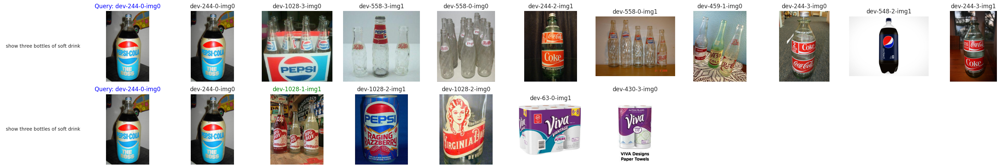

In [21]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0, and without weighted merge beta</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results with alpha=0 and without weighted merge beta</div>

In [22]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results(
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

CIRR val dataset in relative mode initialized


100%|██████████| 131/131 [00:08<00:00, 15.11it/s]


Recall Results
Recall at 1: 13.42
Recall at 5: 40.04
Recall at 10: 54.44
Recall at 50: 83.71

Group Recall Results
Group Recall at 1: 33.60
Group Recall at 2: 58.74
Group Recall at 3: 76.97

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [23]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [24]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(953, [18, 19, 25, 26, 34, 41, 42, 48, 52, 61])

In [25]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(129, [43, 56, 65, 201, 257, 288, 298, 301, 319, 322])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results</div>

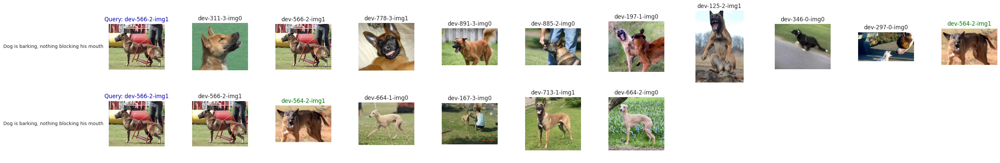

In [26]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=18)

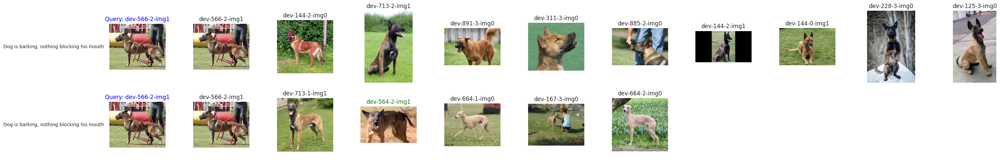

In [27]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=18)

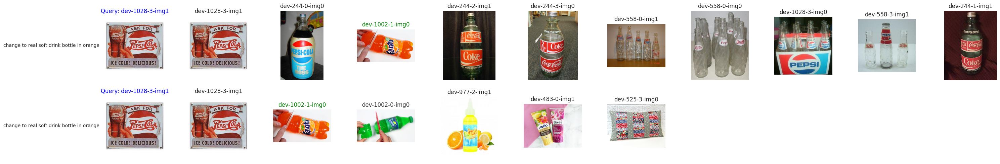

In [28]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

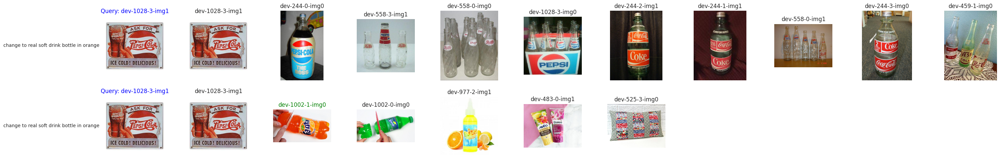

In [29]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)

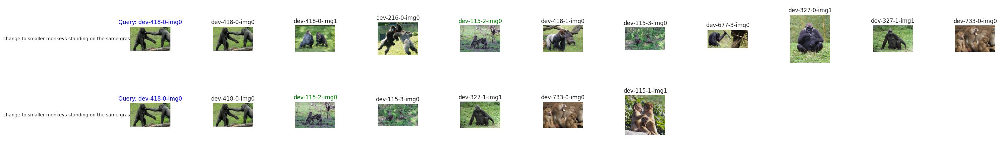

In [30]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=25)

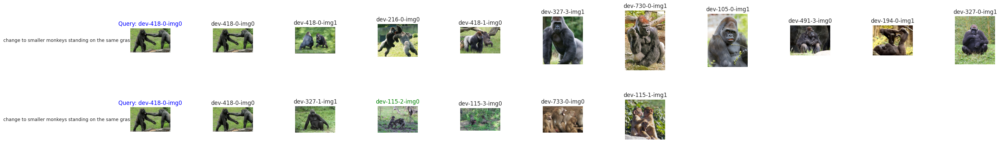

In [31]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=25)